Implement an MLP Classifier for image classification

In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt
import cv2
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, \
    ConfusionMatrixDisplay
from timeit import default_timer as timer
from tqdm import tqdm

In [3]:
# Load dataset
def load_dataset(base_path='Images', img_size=256):
    X = []
    Y = []
    LABELS = sorted(os.listdir(base_path))  # Auto-detect all subdirectories (class labels)

    for label in LABELS:
        class_path = os.path.join(base_path, label)

        if not os.path.exists(class_path):  # Ensure directory exists
            print(f"Warning: Directory {class_path} not found!")
            continue

        for img_name in tqdm(os.listdir(class_path), desc=f"Loading {label} images"):
            img_path = os.path.join(class_path, img_name)

            img = cv2.imread(img_path, cv2.IMREAD_COLOR)  # Read image in BGR
            if img is None:
                continue  # Skip unreadable images

            img = cv2.resize(img, (img_size, img_size))  # Resize image
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert to RGB
            img = img / 255.0  # Normalize pixel values (0-1)

            X.append(img)
            Y.append(label)

    return np.array(X), np.array(Y)


In [4]:
# Read and Reize an input image
def preprocess_image(path_to_image, img_size=256):

    img = cv2.imread(path_to_image, cv2.IMREAD_COLOR)  # Read image in
    img = cv2.resize(img, (img_size, img_size))  # Resize image
    return np.array(img)

In [5]:
# Extract colour histogram features from a dataset of images
def extract_color_histogram(dataset, hist_size=6):
  col_hist = []
  for img in dataset:
    img = (img * 255).astype(np.uint8)
    hist = cv2.calcHist([img], [0, 1, 2], None, [hist_size, hist_size, hist_size], [0, 256, 0, 256, 0, 256])
    col_hist.append(cv2.normalize(hist, None, 0, 1, cv2.NORM_MINMAX).flatten())
  return np.array(col_hist)

In [6]:
# Step 1: Load dataset
base_path = r"C:\Users\Jia Yi Chow\Downloads\images\Images"
print("Loading dataset...")
# unpacking values returned by the function load_dataset(base_path)
X, Y = load_dataset(base_path) # Load the dataset
X = np.array(X) # the features
Y = np.array(Y) # the label

Loading dataset...


Loading n02092339-Weimaraner images: 100%|██████████| 160/160 [00:01<00:00, 100.45it/s]
Loading n02093256-Staffordshire_bullterrier images: 100%|██████████| 155/155 [00:01<00:00, 90.53it/s]
Loading n02093428-American_Staffordshire_terrier images: 100%|██████████| 164/164 [00:01<00:00, 103.36it/s]
Loading n02097658-silky_terrier images: 100%|██████████| 183/183 [00:02<00:00, 85.34it/s]
Loading n02098105-soft-coated_wheaten_terrier images: 100%|██████████| 156/156 [00:01<00:00, 107.92it/s]
Loading n02098286-West_Highland_white_terrier images: 100%|██████████| 169/169 [00:01<00:00, 102.32it/s]
Loading n02099712-Labrador_retriever images: 100%|██████████| 171/171 [00:01<00:00, 120.66it/s]
Loading n02099849-Chesapeake_Bay_retriever images: 100%|██████████| 167/167 [00:01<00:00, 116.01it/s]
Loading n02100236-German_short-haired_pointer images: 100%|██████████| 152/152 [00:01<00:00, 108.79it/s]
Loading n02107312-miniature_pinscher images: 100%|██████████| 184/184 [00:02<00:00, 88.60it/s]
Load

In [7]:
# Step 2: Split dataset into train (70%), validation (15%), and test (15%) datasets
print("Splitting dataset...")
X_train, X_temp, Y_train, Y_temp = train_test_split(X, Y, test_size = 0.3, random_state = 42)
X_val, X_test, Y_val, Y_test = train_test_split(X_temp, Y_temp, test_size = 0.5, random_state = 42)

# Verify split sizes
print(f"Train Set: {len(X_train)}, Validation Set: {len(X_val)}, Test Set: {len(X_test)}")

Splitting dataset...
Train Set: 14406, Validation Set: 3087, Test Set: 3087


In [8]:
# Step 3: Extract colour histogram features from the datasets
print("Extracting color histogram features...")
X_train_features = extract_color_histogram(X_train)
X_val_features = extract_color_histogram(X_val)
X_test_features = extract_color_histogram(X_test)

Extracting color histogram features...


In [9]:
# Step 4: Define MLP Architecture
n_hidden_1 = 32
n_hidden_2 = 64
n_hidden_3 = 128

n_hidden_options = [
    n_hidden_1,
    n_hidden_2,
    n_hidden_3,
    (n_hidden_1, n_hidden_1),
    (n_hidden_2, n_hidden_2),
    (n_hidden_3, n_hidden_3),
    (n_hidden_1, n_hidden_1, n_hidden_1),
    (n_hidden_2, n_hidden_2, n_hidden_2),
    (n_hidden_3, n_hidden_3, n_hidden_3)
]

In [10]:
# Step 5: Train and Select the Best MLP Model -> Optimal Structure
from sklearn.preprocessing import LabelEncoder

# Ensure labels are numeric
encoder = LabelEncoder()
Y_train_encoded = encoder.fit_transform(Y_train)  # Convert string labels to integers
Y_val_encoded = encoder.transform(Y_val)
Y_test_encoded = encoder.transform(Y_test) # Ensure test labels are also transformed

# Ensure feature arrays are NumPy arrays
X_train_features = np.array(X_train_features, dtype=np.float32)
X_val_features = np.array(X_val_features, dtype=np.float32)

print(f"Y_train dtype: {Y_train.dtype}") # Should be int32 or int64
print(f"Unique labels in Y_train: {np.unique(Y_train)}") # Should be numeric  

Y_train dtype: <U40
Unique labels in Y_train: ['n02085620-Chihuahua' 'n02085782-Japanese_spaniel'
 'n02085936-Maltese_dog' 'n02086079-Pekinese' 'n02086240-Shih-Tzu'
 'n02086646-Blenheim_spaniel' 'n02086910-papillon' 'n02087046-toy_terrier'
 'n02087394-Rhodesian_ridgeback' 'n02088094-Afghan_hound'
 'n02088238-basset' 'n02088364-beagle' 'n02088466-bloodhound'
 'n02088632-bluetick' 'n02089078-black-and-tan_coonhound'
 'n02089867-Walker_hound' 'n02089973-English_foxhound' 'n02090379-redbone'
 'n02090622-borzoi' 'n02090721-Irish_wolfhound'
 'n02091032-Italian_greyhound' 'n02091134-whippet'
 'n02091244-Ibizan_hound' 'n02091467-Norwegian_elkhound'
 'n02091635-otterhound' 'n02091831-Saluki' 'n02092002-Scottish_deerhound'
 'n02092339-Weimaraner' 'n02093256-Staffordshire_bullterrier'
 'n02093428-American_Staffordshire_terrier' 'n02093647-Bedlington_terrier'
 'n02093754-Border_terrier' 'n02093859-Kerry_blue_terrier'
 'n02093991-Irish_terrier' 'n02094114-Norfolk_terrier'
 'n02094258-Norwich_terrie

In [ ]:
best_accuracy = 0
best_structure = 0 

for test_case in tqdm(n_hidden_options, desc="Testing MLP Architectures"):
    print(f"Testing structure: {test_case}")
    
    # Initialize and train an MLP model
    clf = MLPClassifier(hidden_layer_sizes=test_case, activation='relu', solver='adam', max_iter=2000,
                        random_state=1, early_stopping=True)

    clf.fit(X_train_features, Y_train_encoded) # Ensure Y_train is numeric
    
    # Predict class labels directly
    y_pred = clf.predict(X_val_features)
    
    # Convert back to original labels for comparison
    y_pred_labels = encoder.inverse_transform(y_pred)

    val_accuracy = accuracy_score(Y_val, y_pred_labels)
    print(f"Validation Accuracy: {val_accuracy:.4f}")

    # Store the best model
    if val_accuracy > best_accuracy:
        best_accuracy = val_accuracy
        best_structure = test_case
    
    print(f"Best structure: {best_structure} with validation accuracy {best_accuracy: .4f}")

Testing MLP Architectures:   0%|          | 0/9 [00:00<?, ?it/s]

Testing structure: 32


Testing MLP Architectures:  11%|█         | 1/9 [00:01<00:08,  1.08s/it]

Validation Accuracy: 0.0295
Best structure: 32 with validation accuracy  0.0295
Testing structure: 64


Testing MLP Architectures:  22%|██▏       | 2/9 [00:04<00:15,  2.19s/it]

Validation Accuracy: 0.0499
Best structure: 64 with validation accuracy  0.0499
Testing structure: 128


Testing MLP Architectures:  33%|███▎      | 3/9 [00:09<00:22,  3.72s/it]

Validation Accuracy: 0.0515
Best structure: 128 with validation accuracy  0.0515
Testing structure: (32, 32)


Testing MLP Architectures:  44%|████▍     | 4/9 [00:18<00:28,  5.73s/it]

Validation Accuracy: 0.0505
Best structure: 128 with validation accuracy  0.0515
Testing structure: (64, 64)


Testing MLP Architectures:  56%|█████▌    | 5/9 [00:23<00:21,  5.34s/it]

Validation Accuracy: 0.0538
Best structure: (64, 64) with validation accuracy  0.0538
Testing structure: (128, 128)


Testing MLP Architectures:  67%|██████▋   | 6/9 [00:26<00:14,  4.86s/it]

Validation Accuracy: 0.0518
Best structure: (64, 64) with validation accuracy  0.0538
Testing structure: (32, 32, 32)


Testing MLP Architectures:  78%|███████▊  | 7/9 [00:32<00:10,  5.06s/it]

Validation Accuracy: 0.0398
Best structure: (64, 64) with validation accuracy  0.0538
Testing structure: (64, 64, 64)


Testing MLP Architectures:  89%|████████▉ | 8/9 [00:37<00:04,  4.95s/it]

Validation Accuracy: 0.0538
Best structure: (64, 64) with validation accuracy  0.0538
Testing structure: (128, 128, 128)


Testing MLP Architectures: 100%|██████████| 9/9 [00:44<00:00,  4.95s/it]

Validation Accuracy: 0.0622
Best structure: (128, 128, 128) with validation accuracy  0.0622


In [15]:
# Step 6: Train an MLP classifier with the optimal structure
print("Training final MLP classifier...")

# Ensure labels are numeric
encoder = LabelEncoder()
Y_train_encoded = encoder.fit_transform(Y_train) # Convert train labels to integer
Y_val_encoded = encoder.transform(Y_val) # Convert val labels to integers

# Stack train + validation sets
X_train_val = np.vstack((X_train_features, X_val_features))
Y_train_val = np.hstack((Y_train_encoded, Y_val_encoded))

# Ensure correct shapes
X_train_val = np.array(X_train_val, dtype=np.float32).reshape(len(X_train_val), -1)

print(f"Final Training Data Shape: {X_train_val.shape}, {Y_train_val.shape}")

# Train the model
final_clf = MLPClassifier(hidden_layer_sizes=best_structure, activation='relu', solver='adam',
                            max_iter=2000, random_state=1, early_stopping=True)

final_clf.fit(X_train_val, Y_train_val) # Display the blue table

Training final MLP classifier...
Final Training Data Shape: (17493, 216), (17493,)


MLPClassifier(early_stopping=True, hidden_layer_sizes=(128, 128, 128),
              max_iter=2000, random_state=1)

In [16]:
# Step 7: Evaluate the MLP on the test dataset
X_test_features = np.array(X_test_features, dtype=np.float32)
Y_pred = final_clf.predict(X_test_features)

# Convert the numeric predictions back to original labels
Y_pred_encoded = final_clf.predict(X_test_features)
Y_pred = encoder.inverse_transform(Y_pred)
test_accuracy = accuracy_score(Y_test, Y_pred)
print(f"Test Accuracy: {test_accuracy:.4f}")

Test Accuracy: 0.0534


In [17]:
# Calculate Mean Average Precision (MAP)
from sklearn.metrics import average_precision_score
from sklearn.preprocessing import label_binarize

# Properly binarize test labels
n_classes = len(encoder.classes_)
Y_test_encoded_binarized = label_binarize(Y_test_encoded, classes=np.arange(n_classes))

# Ensure valid probabilities
probs = final_clf.predict_proba(X_test_features)
print(f"Shape of prediction probabilities: {probs.shape}")

# Compute Mean Average Precision (MAP) with weighted averaging
average_precision = average_precision_score(Y_test_encoded_binarized, probs, average="weighted")

# Print the Mean Average Precision (MAP)
print(f"Mean Average Precision (MAP): {average_precision:.4f}")

Shape of prediction probabilities: (3087, 120)
Mean Average Precision (MAP): 0.0401


In [18]:
# Step 8: Classification Report
print("Classification Report:")
print(f"Accuracy: {accuracy_score(Y_test, Y_pred):.4f}")
print(f"Precision: {precision_score(Y_test, Y_pred, average='weighted'):.4f}")
print(f"Recall: {recall_score(Y_test, Y_pred, average='weighted'):.4f}")
print(f"F1 Score: {f1_score(Y_test, Y_pred, average='weighted'):.4f}")

Classification Report:
Accuracy: 0.0534
Precision: 0.0393
Recall: 0.0534
F1 Score: 0.0374


c:\Users\Jia Yi Chow\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


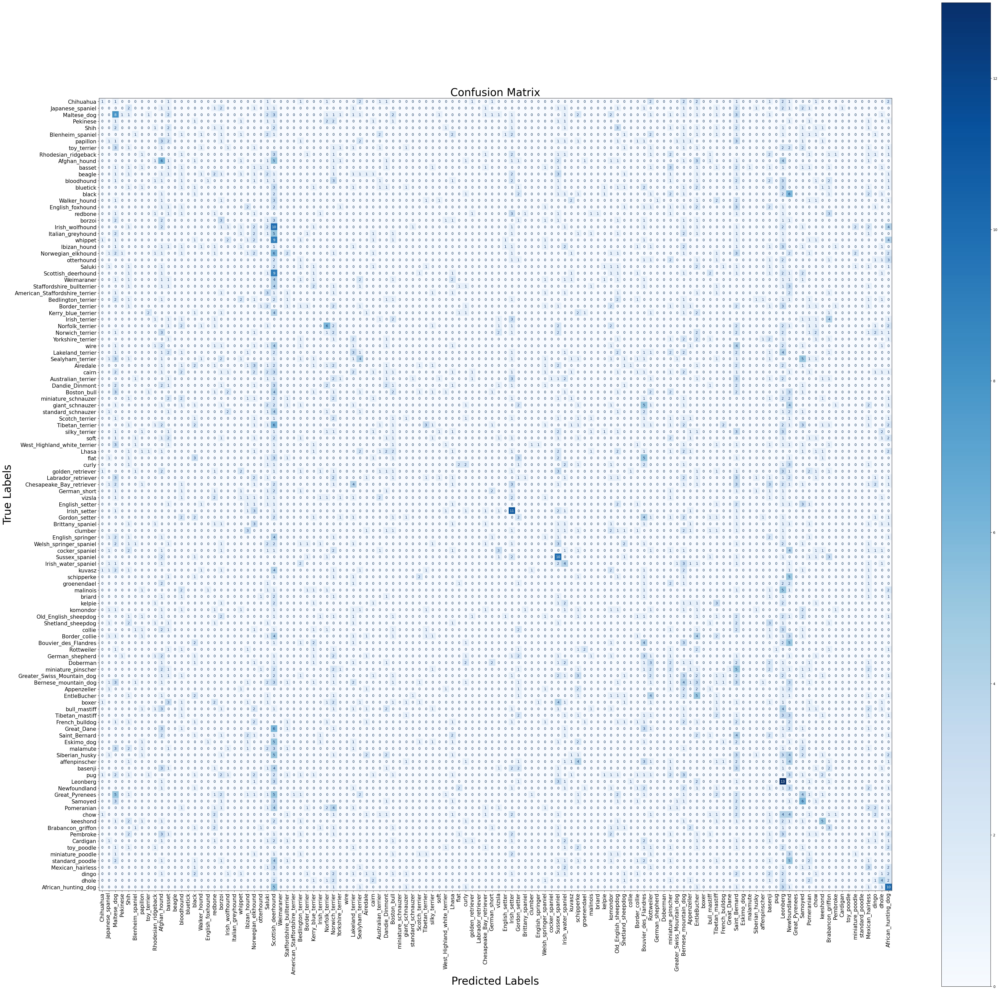

In [19]:
# Step 9: Plot the Confusion Matrix
# Extract only the breed names from encoder classes to match the format of Y_test and Y_pred
common_label = [label.split('-')[1] if '-' in label else label for label in encoder.classes_]

# Extract the breed names from Y_test and Y_pred
Y_test_breed_names = [label.split('-')[1] if '-' in label else label for label in Y_test]
Y_pred_breed_names = [label.split('-')[1] if '-' in label else label for label in Y_pred]

# Filter out labels not present in Y_test or Y_pred
valid_labels = [label for label in common_label if label in Y_test_breed_names or label in Y_pred_breed_names]

# Now create the confusion matrix with the filtered valid_labels
if common_label:
    conf_matrix = confusion_matrix(Y_test_breed_names, Y_pred_breed_names, labels=valid_labels)

    # Adjust the size (width x height)
    fig, ax = plt.subplots(figsize=(50, 50))

    # Display the confusion matrix
    disp = ConfusionMatrixDisplay(conf_matrix, display_labels=valid_labels)
    disp.plot(cmap=plt.cm.Blues, ax=ax)

    # Set title and adjust font size
    plt.title("Confusion Matrix", fontsize=30)
    
    plt.xlabel("Predicted Labels", fontsize=30)
    plt.ylabel("True Labels", fontsize=30)

    # Rotate x-axis labels and adjust font size
    plt.xticks(rotation=90, fontsize=15)

    # Adjust y-axis labels font size
    plt.yticks(fontsize=15)

    plt.show()
else:
    print("No valid labels found for confusion matrix.")


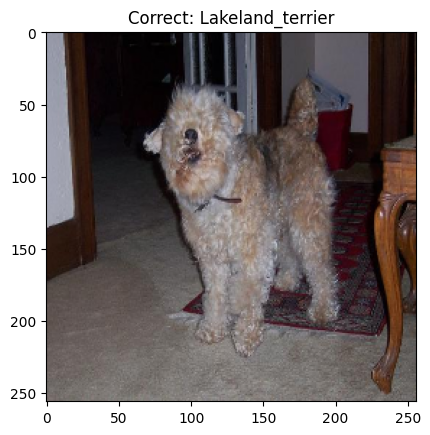

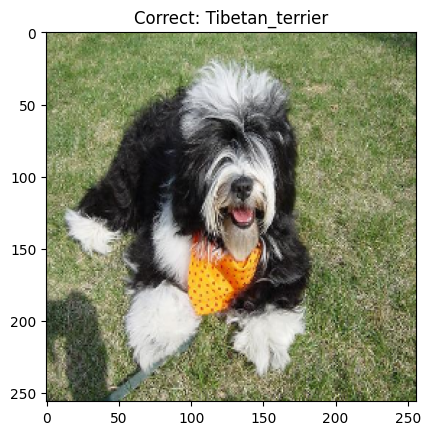

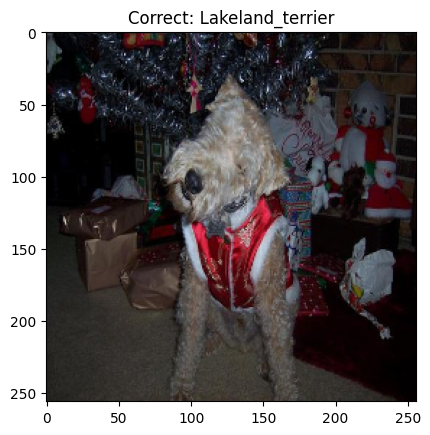

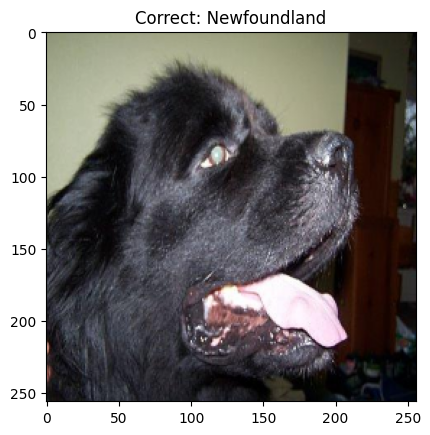

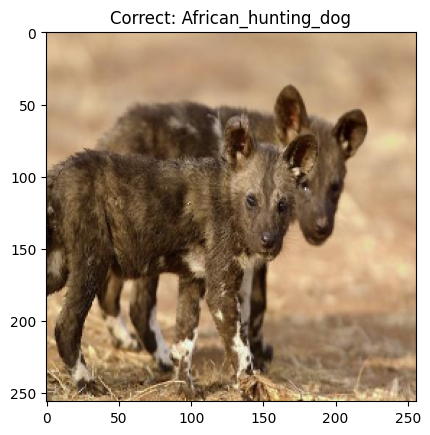

...

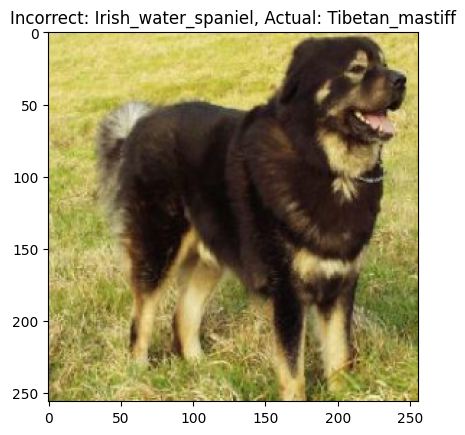

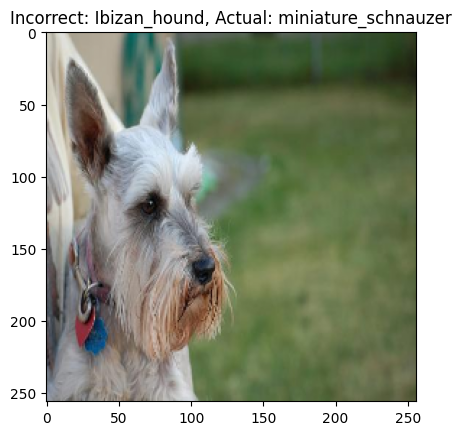

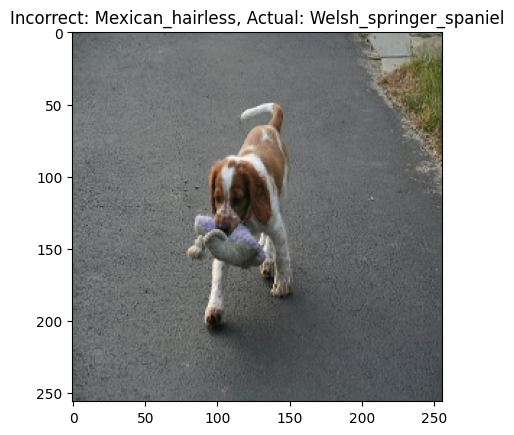

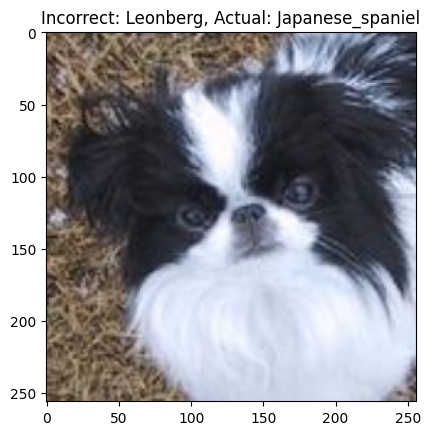

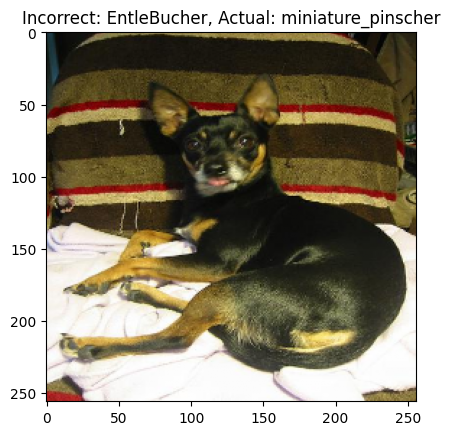

In [20]:
# Step 10: Show the correct and incorrect predictions
correct_indices = np.where(Y_pred == Y_test)[0]
incorrect_indices = np.where(Y_pred != Y_test)[0]

correct_samples = np.random.choice(correct_indices, 15, replace=False)
incorrect_samples = np.random.choice(incorrect_indices, 15, replace=False)

def extract_label(full_label):
    return full_label.split('-')[1] if '-' in full_label else full_label

for i in correct_samples:
    plt.imshow(X_test[i])
    plt.title(f"Correct: {extract_label(Y_pred[i])}")
    plt.show()

for i in incorrect_samples:
    plt.imshow(X_test[i])
    plt.title(f"Incorrect: {extract_label(Y_pred[i])}, Actual: {extract_label(Y_test[i])}")
    plt.show()